<a href="https://colab.research.google.com/github/Raanank10/Instagram-s-influencers/blob/Eladk_20211013/Image_Labels_Contribution_Explaiened_by_SHAP_home.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# inport and install Package

In [214]:
!pip install dataprep

Import Packages:

In [215]:
# General Tools
import numpy as np
import scipy as sp
import pandas as pd
import missingno as msno
import xgboost as xgb
import datetime

# SK Learn
from sklearn.impute import SimpleImputer
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestRegressor
from sklearn import neighbors
from sklearn.linear_model import LogisticRegression
from sklearn import preprocessing
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import MaxAbsScaler, MinMaxScaler, StandardScaler
from sklearn.metrics import confusion_matrix, accuracy_score
from sklearn.metrics import precision_score, recall_score, f1_score
from sklearn.metrics import accuracy_score , confusion_matrix, roc_auc_score, roc_curve
from sklearn.metrics import log_loss
from sklearn.metrics import classification_report # elad 20210708
from sklearn.neighbors import KNeighborsRegressor
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.feature_selection import SelectKBest, chi2, f_classif, mutual_info_classif
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import StratifiedShuffleSplit

from sklearn.preprocessing import OrdinalEncoder # elad 20210911

# Trees Visualization
import pydot
from sklearn.tree import export_graphviz
from sklearn.externals.six import StringIO

# For scoring
from sklearn.metrics import mean_squared_log_error as msle
from sklearn.metrics import mean_squared_error as mse
from sklearn.metrics import r2_score

# Misc
import warnings
from sys import modules
from time import time
from platform import python_version

# Visualization
import matplotlib.pyplot as plt
import plotly.express as px
import seaborn as sns
import plotly.graph_objects as go

# IPython
from IPython.display import Image, display

# Confuguration
warnings.filterwarnings('ignore')
%matplotlib inline

# EDA prep
from dataprep.eda import plot, plot_correlation, plot_missing, create_report


# Get the Data:

In [216]:
path_part0 = 'https://raw.githubusercontent.com/Raanank10/Instagram-s-influencers/main/ai_posts_analysis_data.xlsx'
path_part1= 'https://raw.githubusercontent.com/Raanank10/Instagram-s-influencers/main/project_part1.csv'
path_part2= 'https://raw.githubusercontent.com/Raanank10/Instagram-s-influencers/main/project_part2.csv'

train_size = 0.75
rand_state = 990
sigma = 3
Min_followers = 500

# Bining
bin_labels=['Low','Medium','High', 'Very High','Extreme']

# Concate the 3 files into 1 Datafarme file:

In [217]:
df_part0 = pd.read_csv(path_part0, index_col=0)  
df_part1 = pd.read_csv(path_part1, index_col=0) 
df_part2 = pd.read_csv(path_part2, index_col=0) 
df = pd.concat([df_part0, df_part1, df_part2])

In [218]:
df.columns = df.columns.str.replace(' ', '_')

In [219]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 40849 entries, 1918 to 37857
Data columns (total 26 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   USERID                          40849 non-null  int64  
 1   USERNAME                        40849 non-null  object 
 2   FULLNAME                        39489 non-null  object 
 3   FOLLOWER                        40849 non-null  int64  
 4   POST_ID                         40849 non-null  float64
 5   SHORTCODE                       40849 non-null  object 
 6   LIKES                           40849 non-null  int64  
 7   COMMENTS                        40849 non-null  int64  
 8   ENGAGEMENT                      40849 non-null  float64
 9   URL                             40849 non-null  object 
 10  ACCESSIBILITY_CAPTION           33725 non-null  object 
 11  CAPTION                         34786 non-null  object 
 12  LOCATION                     

Remove row without Image Labels:

In [220]:
print(f'data len Before = {len(df)}')
df = df[df['IMAGE_LABELS'].notna()]
print(f'data len After  = {len(df)}')

data len Before = 40849
data len After  = 40808


In [221]:
#print(f'data len Before = {len(df)}')
len(df[df['FOLLOWER'].notna()])
#print(f'data len After  = {len(df)}')

40808

# Clean the data:

In [222]:
df = df[~df.index.duplicated()]

In [223]:
df = df[df.FOLLOWER >= Min_followers] # 500

In [224]:
df['IMAGE_LABELS'].head()

1
1918    Clothing, Apparel, Text, Money, Collage, Adver...
1920    Clothing, Apparel, Person, Human, Female, Swim...
1922    Clothing, Apparel, Person, Human, Sunglasses, ...
1929    Person, Human, Clothing, Apparel, Sitting, Sho...
1930       Chime, Windchime, Musical Instrument, Lighting
Name: IMAGE_LABELS, dtype: object

In [225]:
df.IMAGE_LABELS = df.IMAGE_LABELS.str.replace(' ', '')

In [226]:
df['IMAGE_LABELS'] = df['IMAGE_LABELS'].str.upper()

In [227]:
df['IMAGE_LABELS'].head()

1
1918    CLOTHING,APPAREL,TEXT,MONEY,COLLAGE,ADVERTISEM...
1920    CLOTHING,APPAREL,PERSON,HUMAN,FEMALE,SWIMWEAR,...
1922    CLOTHING,APPAREL,PERSON,HUMAN,SUNGLASSES,ACCES...
1929    PERSON,HUMAN,CLOTHING,APPAREL,SITTING,SHORTS,A...
1930           CHIME,WINDCHIME,MUSICALINSTRUMENT,LIGHTING
Name: IMAGE_LABELS, dtype: object

In [228]:
df.iloc[['1930']].IMAGE_LABELS

1
4709    NATURE,WATER,OUTDOORS,RIVER,RESERVOIR,RUG,FIR,...
Name: IMAGE_LABELS, dtype: object

# Presenting the Data

In [229]:
df.head(2)

,USERID,USERNAME,FULLNAME,FOLLOWER,POST_ID,SHORTCODE,LIKES,COMMENTS,ENGAGEMENT,URL,ACCESSIBILITY_CAPTION,CAPTION,LOCATION,CITY,COUNTRY,TIME,IMAGE_LABELS,CAPTION_INTEREST,ACCESSIBILITY_CAPTION_INTEREST,IMAGE_LABEL_INTEREST,IMAGE_URL,COMMENT_DISABLED,IS_VIDEO,HAS_AUDIO,VIDEO_URL,VIDEO_VIEW_COUNT
1,,,,,,,,,,,,,,,,,,,,,,,,,,
1918,36193140327,elastici_e_passamaneria,Elastici e Passamaneria,1052,2.530601e+18,CMegChUlwm2,23,0,2.19,https://www.instagram.com/p/CMegChUlwm2,"Photo by Elastici e Passamaneria on March 16, ...",FFP2 MADE IN ITALY????????#ffp2mask#italiansty...,NaN,NaN,NaN,1615891163,"CLOTHING,APPAREL,TEXT,MONEY,COLLAGE,ADVERTISEM...",education,movies,business,https://instagram.fdok2-1.fna.fbcdn.net/v/t51....,no,no,no,NaN,NaN
1920,36838177086,ilaria._004,????????????????,649,2.356209e+18,CCy784yAY26,138,2,21.57,https://www.instagram.com/p/CCy784yAY26,"Photo by ???????????????? on July 18, 2020. Ma...",mirame????,NaN,NaN,NaN,1595102049,"CLOTHING,APPAREL,PERSON,HUMAN,FEMALE,SWIMWEAR,...",education,arts_entertainment,style_fashion,https://instagram.fgua5-1.fna.fbcdn.net/v/t51....,no,no,no,NaN,NaN


In [230]:
df.describe()

,USERID,FOLLOWER,POST_ID,LIKES,COMMENTS,ENGAGEMENT,TIME,VIDEO_VIEW_COUNT
count,2.210900e+04,2.210900e+04,2.210900e+04,2.210900e+04,22109.000000,22109.000000,2.210900e+04,4.088000e+03
mean,1.294132e+10,5.356385e+04,2.560918e+18,1.012655e+03,29.703876,5.446324,1.619499e+09,1.450723e+04
std,1.635062e+10,1.011601e+06,1.702874e+17,2.268217e+04,706.638620,7.578862,2.029325e+07,2.317900e+05
min,3.142160e+05,5.000000e+02,6.216878e+17,0.000000e+00,0.000000,0.000000,1.388331e+09,0.000000e+00
25%,5.638796e+08,9.180000e+02,2.560000e+18,2.300000e+01,0.000000,1.270000,1.619571e+09,9.400000e+01
50%,4.447307e+09,1.616000e+03,2.610000e+18,5.700000e+01,3.000000,3.140000,1.624838e+09,2.355000e+02
75%,2.290415e+10,4.140000e+03,2.650000e+18,1.360000e+02,10.000000,6.960000,1.630711e+09,7.300000e+02
max,4.944817e+10,3.636130e+07,2.670000e+18,1.409732e+06,73188.000000,338.740000,1.632341e+09,9.785071e+06



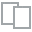
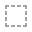
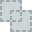
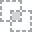
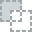
...
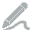
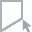
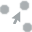
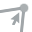
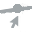

In [231]:
plot_missing(df)


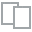
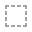
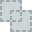
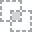
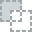
...
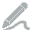
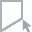
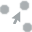
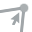
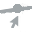

In [232]:
plot(df, "LIKES")


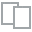
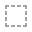
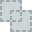
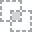
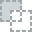
...
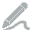
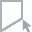
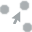
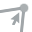
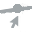

In [233]:
plot(df, "FOLLOWER")


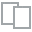
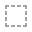
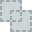
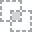
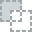
...
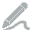
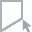
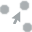
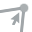
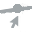

In [234]:
plot(df, "IMAGE_LABELS")

In [235]:
print(f'data len Before = {len(df)}')
df = df[df['ENGAGEMENT'].notna()]
print(f'data len After  = {len(df)}')

data len Before = 22109
data len After  = 22109



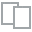
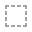
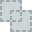
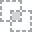
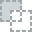
...
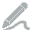
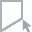
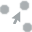
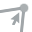
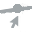

In [236]:
plot(df, "IMAGE_LABEL_INTEREST")

# Prepare the y values

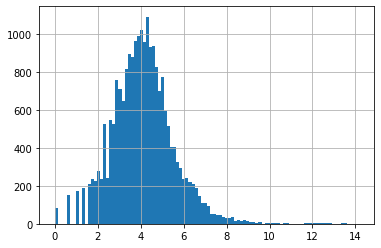

In [237]:
df['log_LIKES']  = np.log1p(df.LIKES)
#df.LIKES.hist(bins=100)
df.log_LIKES.hist(bins=100)

In [238]:
df['LIKES_PER_FOLLOWER'] = df['log_LIKES'] / df['FOLLOWER']
df['log_LIKES_PER_FOLLOWER'] = np.log1p(df.LIKES_PER_FOLLOWER)


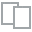
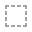
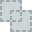
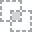
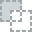
...
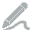
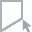
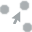
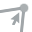
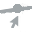

In [239]:
plot(df, "LIKES_PER_FOLLOWER")

# split Image Labels to dummy columns:

In [240]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 22109 entries, 1918 to 37546
Data columns (total 29 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   USERID                          22109 non-null  int64  
 1   USERNAME                        22109 non-null  object 
 2   FULLNAME                        21584 non-null  object 
 3   FOLLOWER                        22109 non-null  int64  
 4   POST_ID                         22109 non-null  float64
 5   SHORTCODE                       22109 non-null  object 
 6   LIKES                           22109 non-null  int64  
 7   COMMENTS                        22109 non-null  int64  
 8   ENGAGEMENT                      22109 non-null  float64
 9   URL                             22109 non-null  object 
 10  ACCESSIBILITY_CAPTION           17747 non-null  object 
 11  CAPTION                         20136 non-null  object 
 12  LOCATION                     

In [241]:
df['IMAGE_LABELS'] = df['IMAGE_LABELS'].str.upper()

In [242]:
df['IMAGE_LABELS'].head()

1
1918    CLOTHING,APPAREL,TEXT,MONEY,COLLAGE,ADVERTISEM...
1920    CLOTHING,APPAREL,PERSON,HUMAN,FEMALE,SWIMWEAR,...
1922    CLOTHING,APPAREL,PERSON,HUMAN,SUNGLASSES,ACCES...
1929    PERSON,HUMAN,CLOTHING,APPAREL,SITTING,SHORTS,A...
1930           CHIME,WINDCHIME,MUSICALINSTRUMENT,LIGHTING
Name: IMAGE_LABELS, dtype: object

In [243]:
df_image_labels_dummies = df['IMAGE_LABELS'].str.get_dummies(sep=',')

In [244]:
df_image_labels_dummies.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 22109 entries, 1918 to 37546
Columns: 2262 entries, ABIES to ZUCCHINI
dtypes: int64(2262)
memory usage: 381.7 MB


In [245]:
df_image_labels_dummies.columns

Index(['ABIES', 'ABSINTHE', 'ABYSSINIAN', 'ACANTHACEAE', 'ACCESSORIES',
       'ACCESSORY', 'ACCIPITER', 'ACCORDION', 'ACORN', 'ACROBATIC',
       ...
       'YARD', 'YARN', 'YEW', 'YOGA', 'YOGURT', 'ZEBRA', 'ZEBRACROSSING',
       'ZIPPER', 'ZOO', 'ZUCCHINI'],
      dtype='object', length=2262)

In [246]:
df_image_labels_dummies.describe()

,ABIES,ABSINTHE,ABYSSINIAN,ACANTHACEAE,ACCESSORIES,ACCESSORY,ACCIPITER,ACCORDION,ACORN,ACROBATIC,ADAPTER,ADVENTURE,ADVERTISEMENT,AERIALVIEW,AFFENPINSCHER,AFTERSHAVE,AGAPANTHUS,AGARIC,AGATE,AGAVACEAE,AGELAIUS,AGRICULTURE,AGROPYRON,AIRCONDITIONER,AIRCRAFT,AIREDALE,AIRFIELD,AIRLINER,AIRPLANE,AIRPORT,AIRPORTTERMINAL,AISLE,ALCOHOL,ALGAE,ALIEN,ALLEY,ALLEYWAY,ALLOYWHEEL,ALMOND,ALOE,...,WINDOWDISPLAY,WINDOWSHADE,WINDSHIELD,WINE,WINEBOTTLE,WINEGLASS,WINTER,WIRE,WIRING,WOK,WOLF,WOMAN,WOOD,WOODENSPOON,WOODLAND,WOOL,WORD,WORKER,WORKINGOUT,WORKSHOP,WORLDOFWARCRAFT,WORSHIP,WOVEN,WREATH,WRESTLING,WRIST,WRISTWATCH,X-RAY,YACHT,YAM,YARD,YARN,YEW,YOGA,YOGURT,ZEBRA,ZEBRACROSSING,ZIPPER,ZOO,ZUCCHINI
count,22109.00000,22109.000000,22109.000000,22109.000000,22109.000000,22109.000000,22109.000000,22109.000000,22109.000000,22109.000000,22109.000000,22109.000000,22109.000000,22109.000000,22109.000000,22109.000000,22109.000000,22109.000000,22109.000000,22109.000000,22109.000000,22109.000000,22109.000000,22109.000000,22109.000000,22109.000000,22109.000000,22109.000000,22109.000000,22109.000000,22109.000000,22109.000000,22109.000000,22109.000000,22109.000000,22109.000000,22109.000000,22109.000000,22109.000000,22109.000000,...,22109.000000,22109.000000,22109.000000,22109.000000,22109.000000,22109.000000,22109.000000,22109.000000,22109.000000,22109.000000,22109.000000,22109.000000,22109.000000,22109.000000,22109.000000,22109.000000,22109.000000,22109.000000,22109.000000,22109.000000,22109.000000,22109.000000,22109.000000,22109.000000,22109.000000,22109.000000,22109.000000,22109.000000,22109.000000,22109.000000,22109.000000,22109.000000,22109.000000,22109.000000,22109.000000,22109.000000,22109.000000,22109.000000,22109.000000,22109.000000
mean,0.00778,0.000045,0.001176,0.000543,0.128862,0.128862,0.000090,0.000045,0.000090,0.001402,0.000543,0.008775,0.118051,0.001945,0.000633,0.000362,0.000045,0.000362,0.000181,0.000452,0.000090,0.000859,0.000090,0.000317,0.002397,0.000045,0.000633,0.000271,0.001674,0.001131,0.000136,0.000226,0.016419,0.000090,0.000362,0.001945,0.001945,0.006649,0.000181,0.000362,...,0.000271,0.000588,0.000362,0.003211,0.000317,0.002216,0.002804,0.000045,0.000452,0.000090,0.000452,0.191913,0.057443,0.000045,0.017956,0.001312,0.028314,0.002307,0.013207,0.001628,0.002804,0.004026,0.000452,0.000181,0.000181,0.002216,0.004523,0.000181,0.000814,0.000090,0.020263,0.000543,0.000181,0.002171,0.000905,0.000181,0.000769,0.000271,0.001674,0.000090
std,0.08786,0.006725,0.034273,0.023292,0.335054,0.335054,0.009511,0.006725,0.009511,0.037420,0.023292,0.093264,0.322676,0.044059,0.025157,0.019019,0.006725,0.019019,0.013450,0.021263,0.009511,0.029303,0.009511,0.017791,0.048904,0.006725,0.025157,0.016472,0.040875,0.033609,0.011648,0.015037,0.127082,0.009511,0.019019,0.044059,0.044059,0.081271,0.013450,0.019019,...,0.016472,0.024242,0.019019,0.056579,0.017791,0.047026,0.052882,0.006725,0.021263,0.009511,0.021263,0.393814,0.232692,0.006725,0.132796,0.036194,0.165873,0.047974,0.114164,0.040320,0.052882,0.063321,0.021263,0.013450,0.013450,0.047026,0.067103,0.013450,0.028522,0.009511,0.140903,0.023292,0.013450,0.046545,0.030064,0.013450,0.027719,0.016472,0.040875,0.009511
min,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0000

In [247]:
s = (df_image_labels_dummies.apply(lambda col: col.sum()).sort_values(ascending=False))

In [248]:
s

PERSON       15050
HUMAN        15050
APPAREL      10301
CLOTHING     10301
FACE          7564
             ...  
PLATERACK        1
BURNER           1
POLARBEAR        1
FLY              1
CDPLAYER         1
Length: 2262, dtype: int64

In [249]:
df_all_labels = pd.DataFrame({'LABEL':s.index, 'LABEL_COUNT':s.values})

In [250]:
df_all_labels

,LABEL,LABEL_COUNT
0,PERSON,15050
1,HUMAN,15050
2,APPAREL,10301
3,CLOTHING,10301
4,FACE,7564
...,...,...
2257,PLATERACK,1
2258,BURNER,1
2259,POLARBEAR,1
2260,FLY,1



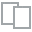
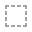
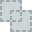
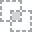
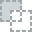
...
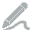
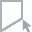
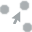
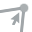
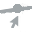

In [251]:
plot(df_all_labels, "LABEL")

In [252]:
df_all_labels[df_all_labels['LABEL'] == 'COMPUTER']

,LABEL,LABEL_COUNT
172,COMPUTER,341


In [253]:
df_all_labels[df_all_labels['LABEL'].str.contains('room')]

,LABEL,LABEL_COUNT


In [254]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 22109 entries, 1918 to 37546
Data columns (total 29 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   USERID                          22109 non-null  int64  
 1   USERNAME                        22109 non-null  object 
 2   FULLNAME                        21584 non-null  object 
 3   FOLLOWER                        22109 non-null  int64  
 4   POST_ID                         22109 non-null  float64
 5   SHORTCODE                       22109 non-null  object 
 6   LIKES                           22109 non-null  int64  
 7   COMMENTS                        22109 non-null  int64  
 8   ENGAGEMENT                      22109 non-null  float64
 9   URL                             22109 non-null  object 
 10  ACCESSIBILITY_CAPTION           17747 non-null  object 
 11  CAPTION                         20136 non-null  object 
 12  LOCATION                     

In [255]:
df.columns

Index(['USERID', 'USERNAME', 'FULLNAME', 'FOLLOWER', 'POST_ID', 'SHORTCODE',
       'LIKES', 'COMMENTS', 'ENGAGEMENT', 'URL', 'ACCESSIBILITY_CAPTION',
       'CAPTION', 'LOCATION', 'CITY', 'COUNTRY', 'TIME', 'IMAGE_LABELS',
       'CAPTION_INTEREST', 'ACCESSIBILITY_CAPTION_INTEREST',
       'IMAGE_LABEL_INTEREST', 'IMAGE_URL', 'COMMENT_DISABLED', 'IS_VIDEO',
       'HAS_AUDIO', 'VIDEO_URL', 'VIDEO_VIEW_COUNT', 'log_LIKES',
       'LIKES_PER_FOLLOWER', 'log_LIKES_PER_FOLLOWER'],
      dtype='object')

In [256]:
df_with_dummies = pd.concat([df['log_LIKES'], df_image_labels_dummies])

In [257]:
df_with_dummies.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 44218 entries, 1918 to 37546
Columns: 2263 entries, 0 to ZUCCHINI
dtypes: float64(2263)
memory usage: 763.8 MB


In [258]:
df_with_dummies.columns

Index([              0,         'ABIES',      'ABSINTHE',    'ABYSSINIAN',
         'ACANTHACEAE',   'ACCESSORIES',     'ACCESSORY',     'ACCIPITER',
           'ACCORDION',         'ACORN',
       ...
                'YARD',          'YARN',           'YEW',          'YOGA',
              'YOGURT',         'ZEBRA', 'ZEBRACROSSING',        'ZIPPER',
                 'ZOO',      'ZUCCHINI'],
      dtype='object', length=2263)

Sampling random data:

In [259]:
num_of_samples = 5
list_of_sample_index = list((df.URL.sample(num_of_samples).index.values))
print('indesc sample are: ', list_of_sample_index)
print(df.loc[list_of_sample_index]['URL'])
df.loc[list_of_sample_index][['LIKES','CAPTION','ACCESSIBILITY_CAPTION','IMAGE_LABELS','CAPTION_INTEREST', 'ACCESSIBILITY_CAPTION_INTEREST','IMAGE_LABEL_INTEREST'
,'FOLLOWER','LOCATION'
#,'NUMBER_OF_WORDS_IN_CAPTION', 'NUMBER_OF_EXCLAMATION_MARK_IN_CAPTION','NUMBER_OF_QUESTION_MARK_IN_CAPTION','NUMBER_OF_HASH_IN_CAPTION','NUMBER_OF_AT_IN_CAPTION','NUMBER_OF_COMMA_IN_CAPTION' # <- new added columns
]]

indesc sample are:  [31778, 13325, 23335, 22123, 20397]
1
31778    https://www.instagram.com/p/CRbT36jjlK4
13325    https://www.instagram.com/p/CR16q1fDccM
23335    https://www.instagram.com/p/CPj5fkQravt
22123    https://www.instagram.com/p/CS68xKfgLNP
20397    https://www.instagram.com/p/CR2mvLOn6Pk
Name: URL, dtype: object


,LIKES,CAPTION,ACCESSIBILITY_CAPTION,IMAGE_LABELS,CAPTION_INTEREST,ACCESSIBILITY_CAPTION_INTEREST,IMAGE_LABEL_INTEREST,FOLLOWER,LOCATION
1,,,,,,,,,
31778,62,☀️????\n•\n•\n•\n•\n#spain #sewila #hiszpania ...,Photo by Jυsтуиα ♌️ in Plaza de España with @t...,"PERSON,HUMAN,ARCHITECTURE,BUILDING,SHORTS,CLOT...",travel,travel,events,822,Plaza de España
13325,287,Just POST it already!!\n\nI talk with people e...,NaN,"FACE,PERSON,HUMAN,SMILE,CLOTHING,APPAREL,FLYER...",arts_entertainment,NaN,arts_entertainment,9254,"Sacramento, California"
23335,5,Ultimate shortcut to heaven.\n( dont be part o...,"Photo by A.d.i on May 31, 2021. May be an imag...","CLOTHING,APPAREL,PERSON,HUMAN,FACE,FEMALE,TEXT...",parenting,arts_entertainment,style_fashion,1598,NaN
22123,50,AtrÃ©vete a crear y a disfrutar del proceso???...,NaN,"PERSON,HUMAN,CANVAS,FINGER,ACCESSORIES,ACCESSO...",humor,NaN,style_fashion,3534,NaN
20397,106,May or may not (still) get bigger ???? #8month...,NaN,"DOG,CANINE,ANIMAL,PET,MAMMAL,STRAP,LEASH,PUPPY...",arts_entertainment,NaN,pets,596,NaN


# Split X, y

Filter X and y for IMAGE_LABEL_INTEREST is style_fashion only 

In [260]:
index_list_style_fashion = df[df.IMAGE_LABEL_INTEREST == 'home_garden'].index #560
X = df_image_labels_dummies[df_image_labels_dummies.index.isin(index_list_style_fashion)]
y = df['log_LIKES'][df_image_labels_dummies.index.isin(index_list_style_fashion)]

In [282]:
len(X)

560

In [261]:
df.IMAGE_LABEL_INTEREST.value_counts()

style_fashion               8970
arts_entertainment          2654
travel                      2631
food_drink                  1661
business                    1337
sports                       596
home_garden                  560
technology_computing         436
music                        429
events                       360
pets                         339
entertainment                318
movies                       306
parenting                    297
fitness                      176
books_literature             169
weddings                     135
health                       112
news                          91
education                     79
hobbies_interests             76
politics                      66
legal                         62
dating_and_relationships      54
gaming                        44
podcasts                      43
cars_motorcycles              33
baking_cooking                32
comic_books                   11
green_living                   7
accessorie

In [262]:
print('X len is ',len(X)) #8970
print('y len is ',len(y)) #8970

X len is  560
y len is  560


In [263]:
#X_display,y_display = shap.datasets.nhanesi(display=True)

In [264]:
X_train, X_test, y_train, y_test = train_test_split(X, y, train_size = train_size\
                           , random_state = rand_state)#, stratify = df.ENGAGEMENT)

In [265]:
print('Training Features Shape:', X_train.shape)
print('Training Labels (y) Shape:', y_train.shape)
print('Testing Features Shape:', X_test.shape)
print('Testing Labels(y) Shape:', y_test.shape)

Training Features Shape: (420, 2262)
Training Labels (y) Shape: (420,)
Testing Features Shape: (140, 2262)
Testing Labels(y) Shape: (140,)


# XGBoost

In [266]:
XGB_reg = xgb.XGBRegressor()

In [267]:
print(XGB_reg)

XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, gamma=0,
             importance_type='gain', learning_rate=0.1, max_delta_step=0,
             max_depth=3, min_child_weight=1, missing=None, n_estimators=100,
             n_jobs=1, nthread=None, objective='reg:linear', random_state=0,
             reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=None,
             silent=None, subsample=1, verbosity=1)


In [268]:
XGB_reg.fit(X_train, y_train)

[20:10:50] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, gamma=0,
             importance_type='gain', learning_rate=0.1, max_delta_step=0,
             max_depth=3, min_child_weight=1, missing=None, n_estimators=100,
             n_jobs=1, nthread=None, objective='reg:linear', random_state=0,
             reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=None,
             silent=None, subsample=1, verbosity=1)

In [269]:
score = XGB_reg.score(X_train, y_train)  
print("Training score: ", score)

Training score:  0.47216417776915764


Training score:  0.16028416340745355

In [270]:
scores = cross_val_score(XGB_reg, X_train, y_train,cv=10)
print("Mean cross-validation score: %.2f" % scores.mean())

[20:10:53] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[20:10:55] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[20:10:57] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[20:10:59] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[20:11:01] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[20:11:03] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[20:11:05] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[20:11:07] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of re

Mean cross-validation score: 0.09

In [271]:
y_test_pred = XGB_reg.predict(X_test)
mse = mse(y_test, y_test_pred)
score_test = XGB_reg.score(X_test, y_test)  
print("Training score: ", score_test)
print("MSE: %.2f" % mse)
print("RMSE: %.2f" % (mse**0.5))


Training score:  0.08700637906799524
MSE: 1.97
RMSE: 1.40


Training score:  0.10009906359706668
MSE: 2.09
RMSE: 1.44

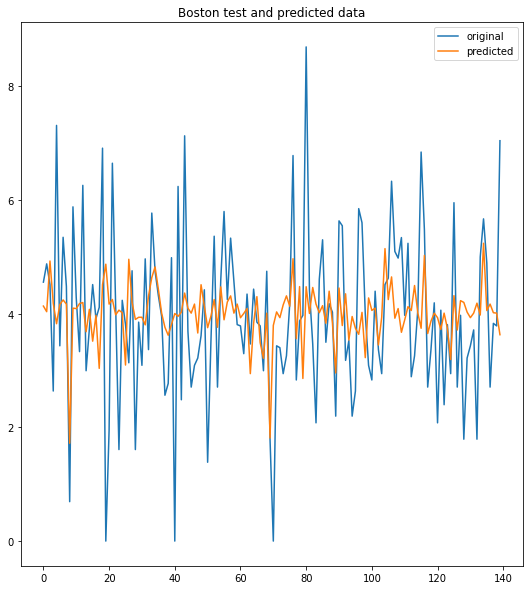

In [272]:
x_ax = range(len(y_test))
fig = plt.figure(figsize=(9, 10))
plt.plot(x_ax, y_test, label="original")
plt.plot(x_ax, y_test_pred, label="predicted")
plt.title("Boston test and predicted data")
plt.legend()
plt.show()

In [273]:
# XGB_param_grid = {'colsample_bytree': [0.3, 0.7, 1.0, 1.2],
#     'n_estimators': [50,100,200],    'max_depth': [2,3,4]
# }
# XGB_reg_grid = xgb.XGBRegressor()
# grid_mse = GridSearchCV(param_grid=XGB_param_grid, estimator=XGB_reg_grid, 
#                         scoring='neg_mean_squared_error', cv=4, verbose=1)
# grid_mse.fit(X, y)
# # Print the best parameters and lowest RMSE
# print("Best parameters found: ", grid_mse.best_params_)
# print("Lowest RMSE found: ", np.sqrt(np.abs(grid_mse.best_score_)))

# # 47 min

Best parameters found:  {'colsample_bytree': 0.7, 'max_depth': 4, 'n_estimators': 50} 

Lowest RMSE found:  1.4466162057711138

In [284]:
x = bst.get_score(importance_type='gain')
feature_important_s = pd.Series(x,index=x.keys())
feature_important_s.sort_values(ascending=False).head(20)

HUMAN                143.990788
SMILE                 46.018000
SWIMWEAR              44.160089
EVENINGDRESS          39.102198
FOOTWEAR              38.403023
DRIVING               37.614545
SEATBELT              28.387680
POSTER                26.544992
TEETH                 23.848934
HIGHHEEL              22.608662
LEISUREACTIVITIES     21.883886
UNDERWEAR             21.346775
TEXT                  20.747015
QUILT                 20.203486
HOTDOG                18.720947
CARSEAT               18.593643
BUCKLE                18.325365
SHIRT                 18.220097
ELEVATOR              18.148693
TIGHTS                17.932941
dtype: float64

In [275]:
feature_important_s = pd.Series(x,index=x.keys())
feature_important_s.sort_values(ascending=False).head(20)

HUMAN                143.990788
SMILE                 46.018000
SWIMWEAR              44.160089
EVENINGDRESS          39.102198
FOOTWEAR              38.403023
DRIVING               37.614545
SEATBELT              28.387680
POSTER                26.544992
TEETH                 23.848934
HIGHHEEL              22.608662
LEISUREACTIVITIES     21.883886
UNDERWEAR             21.346775
TEXT                  20.747015
QUILT                 20.203486
HOTDOG                18.720947
CARSEAT               18.593643
BUCKLE                18.325365
SHIRT                 18.220097
ELEVATOR              18.148693
TIGHTS                17.932941
dtype: float64

# SHAP

In [276]:
!pip install shap
import shap
shap.initjs()

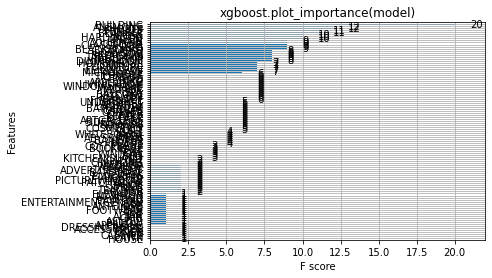

In [277]:
xgb.plot_importance(XGB_reg)
plt.title("xgboost.plot_importance(model)")
plt.show()

In [278]:
# explain the model's predictions using SHAP
# (same syntax works for LightGBM, CatBoost, scikit-learn, transformers, Spark, etc.)
explainer = shap.Explainer(XGB_reg)
shap_values = explainer(X)

In [367]:
num_of_samples = 3
#list_of_sample_index = list((df.URL.sample(num_of_samples).index.values))
list_of_sample_index = df[df.IMAGE_LABEL_INTEREST == 'home_garden'][(df["IMAGE_LABELS"].str.contains("HARDWOOD")) &(df["IMAGE_LABELS"].str.contains("HOMEDECOR"))].sample(num_of_samples).index
print('indesc sample are: ', list_of_sample_index)
print(df.loc[list_of_sample_index]['URL'])
df.loc[list_of_sample_index][['LIKES','FOLLOWER','CAPTION_INTEREST', 'ACCESSIBILITY_CAPTION_INTEREST','IMAGE_LABEL_INTEREST'
,'IMAGE_LABELS','CAPTION','ACCESSIBILITY_CAPTION',
#,'NUMBER_OF_WORDS_IN_CAPTION', 'NUMBER_OF_EXCLAMATION_MARK_IN_CAPTION','NUMBER_OF_QUESTION_MARK_IN_CAPTION','NUMBER_OF_HASH_IN_CAPTION','NUMBER_OF_AT_IN_CAPTION','NUMBER_OF_COMMA_IN_CAPTION' # <- new added columns
]]

indesc sample are:  Int64Index([8213, 7708, 12815], dtype='int64', name='1')
1
8213     https://www.instagram.com/p/CP5__tIgQRV
7708     https://www.instagram.com/p/CP0Gx56hJ1R
12815    https://www.instagram.com/p/CRYseU6p20v
Name: URL, dtype: object


,LIKES,FOLLOWER,CAPTION_INTEREST,ACCESSIBILITY_CAPTION_INTEREST,IMAGE_LABEL_INTEREST,IMAGE_LABELS,CAPTION,ACCESSIBILITY_CAPTION
1,,,,,,,,
8213,209,6520,parenting,NaN,home_garden,"CAR,TRANSPORTATION,VEHICLE,AUTOMOBILE,BRICK,WO...",????@oak_street_eats is a MUST I tried @soulbo...,NaN
7708,122,20965,travel,arts_entertainment,home_garden,"WOOD,CLOTHING,APPAREL,PLYWOOD,PERSON,HUMAN,HAR...",Wanderlust,Photo by Maria Kassandra Barbantonis in Athens...
12815,21,4428,parenting,music,home_garden,"PC,COMPUTER,ELECTRONICS,LAPTOP,LCDSCREEN,MONIT...",Family trivia night! ???? @celestedunn8 @yvett...,"Photo by Y A S | L O N D O N on July 16, 202..."


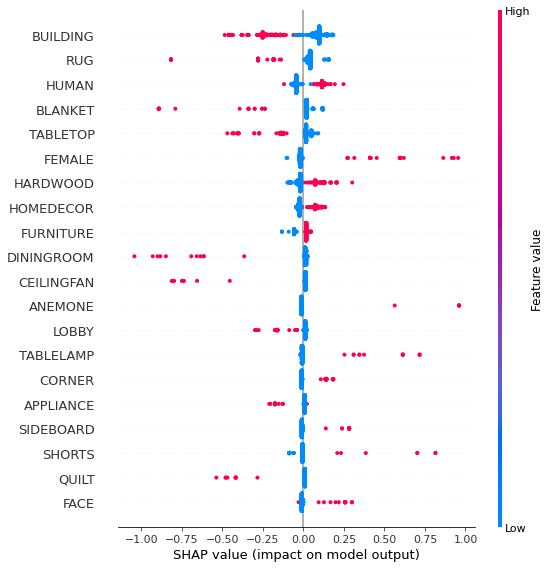

In [279]:
shap.summary_plot(shap_values, X)

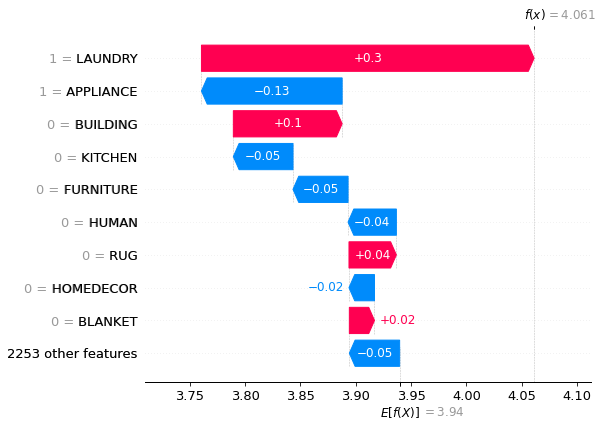

In [280]:
# visualize the first prediction's explanation
shap.plots.waterfall(shap_values[0])

In [281]:
vshap.dependence_plot("Age", shap_values, X)

ValueError: ignored

In [ ]:
shap.force_plot(explainer.expected_value, shap_values[0,:], X_train.iloc[0,:])

In [ ]:
# visualize the first prediction's explanation with a force plot
shap.plots.force(shap_values[0])

In [ ]:
# visualize all the training set predictions
shap.plots.force(shap_values)